In [3]:
import tensorflow as tf
import keras
from keras.models import Sequential, Model
from keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import datetime, os
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications import ResNet50, ResNet152, ResNet50V2, ResNet152V2
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.mobilenet import preprocess_input
from keras.models import load_model
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import img_to_array, load_img

In [7]:
dataset_path = "C:\\Users\\Dell\\Documents\\Codeblocks\\5th sem\\Mini Project\\Code\\"

In [5]:
train_datagen = ImageDataGenerator(
                rescale=1./255,
                rotation_range=20,
                horizontal_flip=True,
                shear_range=0.2,
                fill_mode='nearest', 
                validation_split=0.2
)

In [9]:
train_gen = train_datagen.flow_from_directory(dataset_path+'Dataset',
                                              target_size = (224,224),
                                              batch_size=2,
                                              class_mode="categorical",
                                              shuffle=True,
                                              seed=4,
                                              interpolation='bilinear',
                                              subset='training'
                                              )

valid_gen = train_datagen.flow_from_directory(dataset_path+'Dataset',
                                              target_size = (224,224),
                                              batch_size=2,
                                              class_mode="categorical",
                                              shuffle=True,
                                              seed=4,
                                              interpolation='bilinear',
                                              subset='validation'
                                              )

Found 405 images belonging to 2 classes.
Found 100 images belonging to 2 classes.


In [10]:

train_data = tf.data.Dataset.from_generator(lambda: train_gen,
                                            output_types=(tf.float32, tf.float32),
                                            output_shapes=([None
                                                            , 224, 224, 3]
                                                            , [None, train_gen.num_classes])
                                            )
val_data = tf.data.Dataset.from_generator(lambda: valid_gen,
                                          output_types=(tf.float32, tf.float32),
                                          output_shapes=([None
                                                          , 224, 224, 3]
                                                          , [None, valid_gen.num_classes])
                                          )

(224, 224, 3)


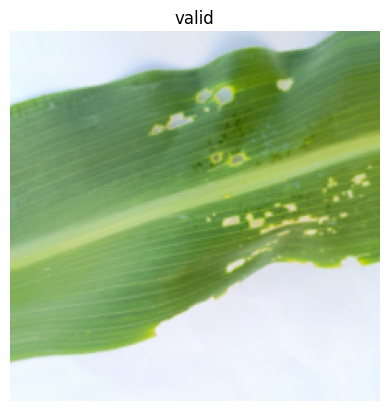

In [11]:
img, label = valid_gen.next()
print(img[0].shape)
plt.imshow(img[0], cmap='gray', vmin=0, vmax=1)
plt.axis('off')
plt.title('valid')
plt.show()
     

In [12]:

waktu =  datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
logdir = os.path.join("MRI-logs", waktu)
logdir = os.path.join("logs", waktu)
     

In [13]:
IMG_SHAPE = (224, 224, 3)
base_model = MobileNetV2(input_shape=IMG_SHAPE,
                         include_top=False,
                         weights='imagenet')

base_model.trainable = False

In [14]:
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
preds = Dense(2, activation='softmax')(x)

In [15]:

model=Model(inputs=base_model.input, outputs=preds)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_1[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][0]']        

In [16]:
model.compile(optimizer='SGD', loss='categorical_crossentropy',metrics=['accuracy'])

In [17]:
waktu =  datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
epochs = 2


logdir = os.path.join("MRI-logs", waktu)
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)


reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                 mode = 'max',
                                                 min_delta = 0.01,
                                                 patience = 3,
                                                 factor = 0.25,
                                                 verbose = 1,
                                                 cooldown = 0,
                                                 min_lr = 0.00000001)


early_stopper = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                 mode = 'max',
                                                 min_delta = 0.005,
                                                 patience = 5,
                                                 verbose = 1,
                                                 restore_best_weights = True)

history = model.fit(train_gen,
                    steps_per_epoch=len(train_gen),  
                    epochs=epochs,
                    validation_data = valid_gen,
                    callbacks=[early_stopper, reduce_lr,tensorboard_callback])




Epoch 1/2
203/203 [==============================] - 200s 950ms/step - loss: 0.4285 - accuracy: 0.8296 - val_loss: 0.1573 - val_accuracy: 0.9500 - lr: 0.0100
Epoch 2/2
203/203 [==============================] - 211s 1s/step - loss: 0.1679 - accuracy: 0.9432 - val_loss: 0.1373 - val_accuracy: 0.9500 - lr: 0.0100


In [18]:
#save model
model_dir = "model-MRI/2M"+ str(waktu)+".h5"
model.save(model_dir)

c:\Program Files\Python311\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [19]:
loss, acc = model.evaluate(train_data,steps=len(train_gen),verbose=0)
print('Accuracy of Train data: {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

loss, acc = model.evaluate(val_data,steps=len(valid_gen),verbose=0)
print('Accuracy of Test data : {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

Accuracy of Train data: 0.9877 | Loss : 0.0405   
Accuracy of Test data : 0.9100 | Loss : 0.1639   


In [20]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
import datetime
import seaborn as sns

In [22]:
print(valid_gen.class_indices)

{'not rust new': 0, 'rust new': 1}


In [23]:
# Assuming you have access to the validation generator
num_notRust = sum(valid_gen.classes == valid_gen.class_indices['not rust new'])
num_rust = sum(valid_gen.classes == valid_gen.class_indices['rust new'])

print(f"Number of images in 'notRust' class in the validation set: {num_notRust}")
print(f"Number of images in 'rust' class in the validation set: {num_rust}")


Number of images in 'notRust' class in the validation set: 65
Number of images in 'rust' class in the validation set: 35


In [29]:
import os
import shutil
from random import sample

# Define your dataset path
dataset_path = "C:\\Users\\Dell\\Documents\\Codeblocks\\5th sem\\Mini Project\\Code\\Dataset"

# Define the number of images you want to take from each class
num_images_per_class = 50

# Define your class labels
class_labels = ["not rust new", "rust new"]  # Add your class labels here

# Create a directory for the validation dataset
validation_path = "./validation_dataset"
os.makedirs(validation_path, exist_ok=True)

# Loop through each class
for label in class_labels:
    # Get the list of images for the current class
    class_images = os.listdir(os.path.join(dataset_path, label))
    
    # Sample 50 images randomly
    selected_images = sample(class_images, num_images_per_class)
    
    # Create a directory for the current class in the validation dataset
    class_validation_path = os.path.join(validation_path, label)
    os.makedirs(class_validation_path, exist_ok=True)
    
    # Copy the selected images to the validation dataset
    for image in selected_images:
        source_path = os.path.join(dataset_path, label, image)
        destination_path = os.path.join(class_validation_path, image)
        shutil.copyfile(source_path, destination_path)

print("Validation dataset generated successfully.")


Validation dataset generated successfully.


Found 100 images belonging to 2 classes.

Validation Metrics:
              precision    recall  f1-score   support

not rust new       1.00      0.60      0.75        50
    rust new       0.71      1.00      0.83        50

    accuracy                           0.80       100
   macro avg       0.86      0.80      0.79       100
weighted avg       0.86      0.80      0.79       100

Validation Confusion Matrix:
[[30 20]
 [ 0 50]]


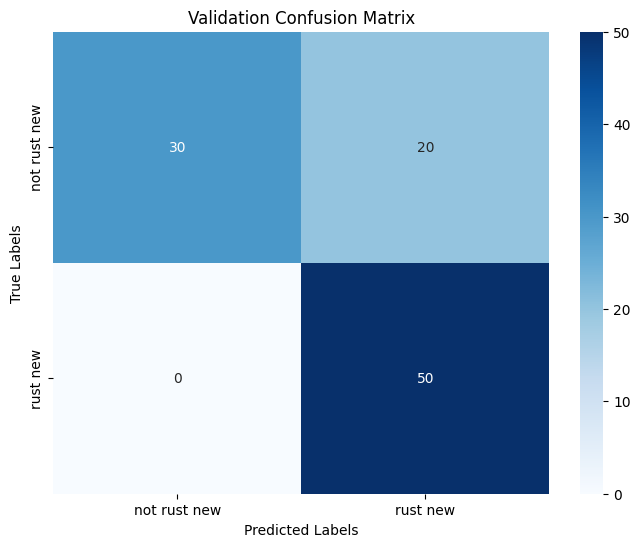

In [30]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have already created the validation set using the modified code

# Define the path to your validation dataset
validation_dataset_path = "./validation_dataset"

# Create an ImageDataGenerator for validation without augmentation
validation_datagen = ImageDataGenerator(rescale=1./255)

# Generate the validation data without augmentation
validation_generator = validation_datagen.flow_from_directory(
    validation_dataset_path,
    target_size=(224, 224),
    batch_size=2,
    class_mode='binary',  # Use binary classification or 'categorical' if you have multiple classes
    shuffle=False
)

# Evaluate on validation data
valid_predictions = model.predict(validation_generator, steps=len(validation_generator), verbose=0)
valid_true_labels = validation_generator.classes  # Assuming labels are not one-hot encoded

# Print and display results
print("\nValidation Metrics:")
valid_report = classification_report(valid_true_labels, np.argmax(valid_predictions, axis=1), target_names=validation_generator.class_indices.keys())
print(valid_report)

# Validation Confusion Matrix
print("Validation Confusion Matrix:")
conf_matrix = confusion_matrix(valid_true_labels, np.argmax(valid_predictions, axis=1))
print(conf_matrix)

# Visualize the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix,
            annot=True, fmt='d', cmap='Blues',
            xticklabels=validation_generator.class_indices.keys(),
            yticklabels=validation_generator.class_indices.keys())
plt.title('Validation Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


In [32]:
model = load_model('model-MRI/FinalModel.h5')



In [33]:
probabilitas = model.predict(valid_gen)
prediction = np.argmax(probabilitas, axis=1)
label = valid_gen.classes
cm=confusion_matrix(label, prediction)

50/50 [==============================] - 43s 814ms/step


In [34]:
cm

array([[49, 16],
       [23, 12]], dtype=int64)

In [35]:
kelas = valid_gen.class_indices

In [36]:
prediction

array([1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], dtype=int64)

In [37]:
def load_image(img_path, show=True):
    
    img = load_img(img_path, target_size=(224, 224))
    img_tensor = img_to_array(img)                   
    img_tensor = np.expand_dims(img_tensor, axis=0)          
    img_tensor /= 255.                                     
    if show:
        plt.imshow(img_tensor[0])                           
        plt.axis('off')
        plt.show()

    return img_tensor

In [38]:
from PIL import Image
import os
import tempfile
from rembg import remove

def process_image(input_path, output_path):
    # Load the image
    original_image = Image.open(input_path)

    p = remove(original_image)

    # Save the processed image to a temporary file
    p.save(output_path)

In [39]:
def predict(new_img):
    #process_image(new_img,"./tempbin")
    path_img = load_image(new_img)
    pre = model.predict(path_img).transpose()
    return pre

In [40]:
from PIL import Image
import numpy as np
import cv2
from matplotlib import pyplot as plt
from rembg import remove


In [41]:

def calculate_rust_percentage(image_path):
    # Open the image
    im = Image.open(image_path)
    image = remove(im)
    # Convert the image to RGB mode
    image_rgb = image.convert('RGB')

    # Convert the image to a NumPy array
    image_array = np.array(image_rgb)

    # Convert the RGB image to HSV
    image_hsv = cv2.cvtColor(image_array, cv2.COLOR_RGB2HSV)

    # Define wider ranges for red and green in HSV
    lower_red = np.array([0, 50, 50])
    upper_red = np.array([30, 255, 255])
    lower_green = np.array([40, 50, 50])
    upper_green = np.array([100, 255, 255])
    
    # Create masks for red and green regions in HSV
    red_mask = cv2.inRange(image_hsv, lower_red, upper_red)
    green_mask = cv2.inRange(image_hsv, lower_green, upper_green)

    # Count the number of pixels for red and green regions
    red_pixels = np.count_nonzero(red_mask)
    green_pixels = np.count_nonzero(green_mask)

    # Create a figure with 3 subplots
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # Display the original image
    axs[0].set_title("Original Image")
    axs[0].imshow(image)

    # Display the rust mask
    axs[1].set_title("Rust affected part")
    axs[1].imshow(red_mask)

    # Display the healthy mask
    axs[2].set_title("Healthy part")
    axs[2].imshow(green_mask)

    plt.show()
    # Calculate rust percentage
    if (red_pixels + green_pixels) == 0:
        rust_percentage = 0
    else:
        rust_percentage = (red_pixels / (red_pixels + green_pixels)) * 100

    return rust_percentage, red_mask, green_mask




In [42]:
categories = ('notRust','rust')

def classify_images(img):
  pred = predict(img)
  k=dict(zip(categories, map(float,pred)))
  print(k)
  if k['rust']>0.5:
    rust_percentage, red_mask, green_mask = calculate_rust_percentage(img)
    print(f'Rust Percentage: {rust_percentage:.2f}%')

In [43]:
def multi_classify(path,start,end):
    while start<=end:
        dir=path+str(start)+".jpg"
        classify_images(dir)
        start=start+1

In [45]:
dpath="C:\\Users\\Dell\\Documents\\Codeblocks\\5th sem\\Mini Project\\Code\\Dataset"

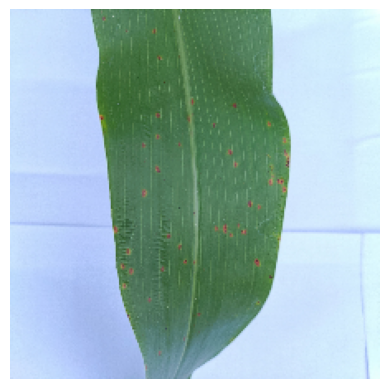

1/1 [==============================] - 2s 2s/step
{'notRust': 0.016747349873185158, 'rust': 0.9832526445388794}


C:\Users\Dell\AppData\Local\Temp\ipykernel_12888\1940373164.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  k=dict(zip(categories, map(float,pred)))


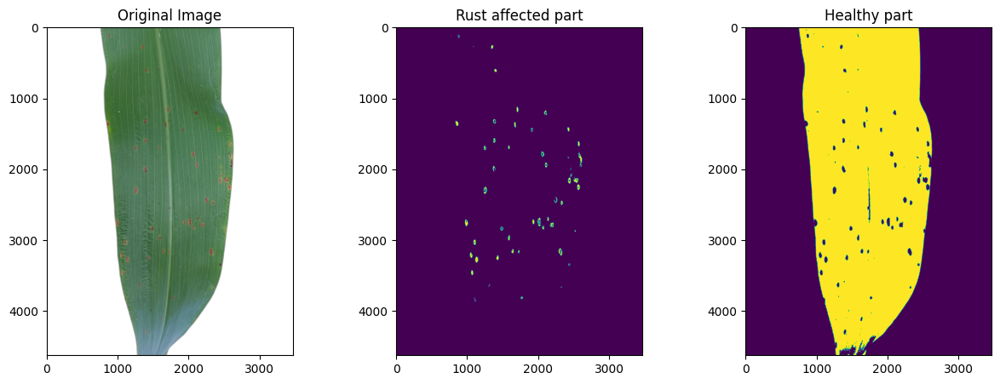

Rust Percentage: 1.00%


In [46]:
classify_images("C:\\Users\\Dell\\Documents\\Codeblocks\\5th sem\\Mini Project\\Code\\Dataset\\rust new\\IMG20231130114354.jpg")

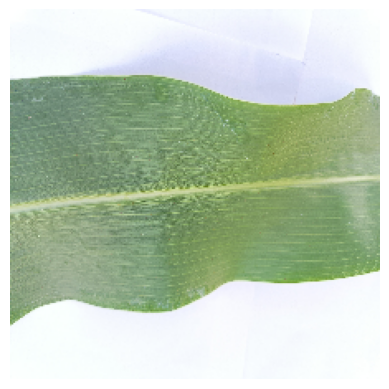

1/1 [==============================] - 0s 193ms/step
{'notRust': 0.8304953575134277, 'rust': 0.16950459778308868}


C:\Users\Dell\AppData\Local\Temp\ipykernel_12888\1940373164.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  k=dict(zip(categories, map(float,pred)))


In [51]:
classify_images("C:\\Users\\Dell\\Documents\\Codeblocks\\5th sem\\Mini Project\\Code\\Dataset\\not rust new\\IMG20231130123856.jpg")

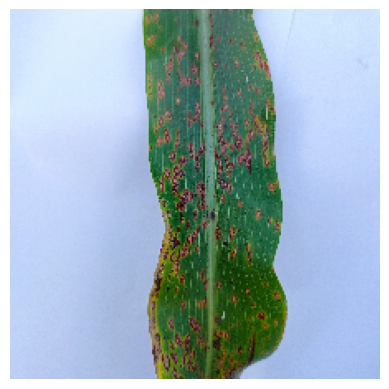

1/1 [==============================] - 0s 73ms/step
{'notRust': 0.0005128299817442894, 'rust': 0.9994871616363525}


C:\Users\Dell\AppData\Local\Temp\ipykernel_12888\1940373164.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  k=dict(zip(categories, map(float,pred)))


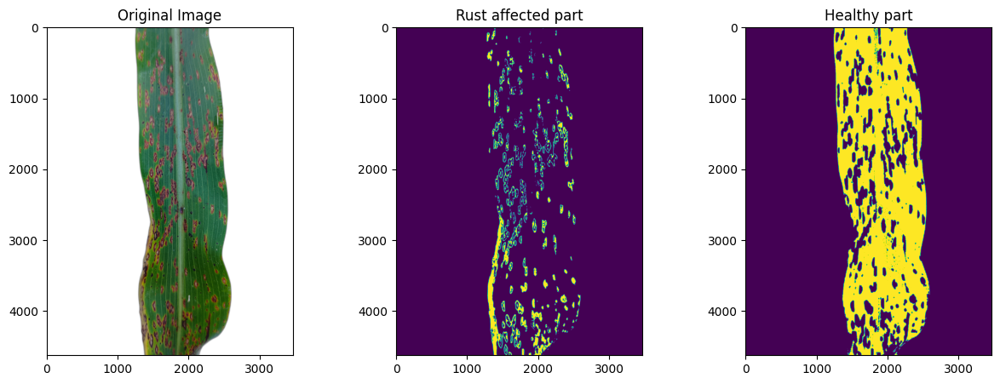

Rust Percentage: 15.17%


In [53]:
classify_images("C:\\Users\\Dell\\Documents\\Codeblocks\\5th sem\\Mini Project\\Code\\Dataset\\rust new\\IMG20231130120508.jpg")

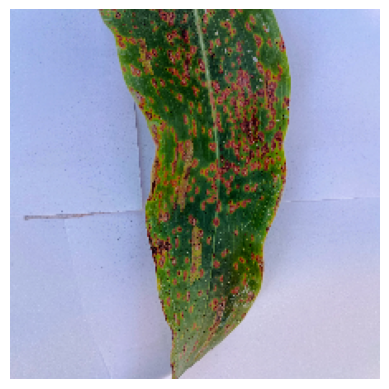

1/1 [==============================] - 0s 55ms/step
{'notRust': 0.008570761419832706, 'rust': 0.9914292693138123}


C:\Users\Asus\AppData\Local\Temp\ipykernel_4392\1940373164.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  k=dict(zip(categories, map(float,pred)))


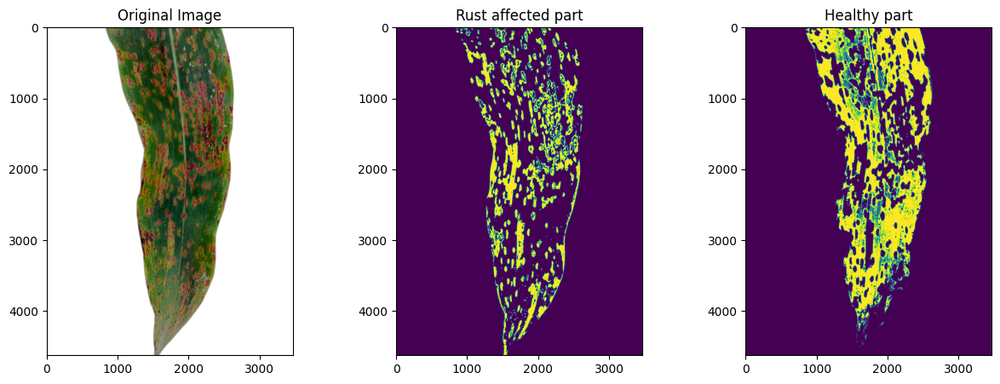

Rust Percentage: 36.47%


In [32]:
classify_images(dpath+"rust/117.jpg")

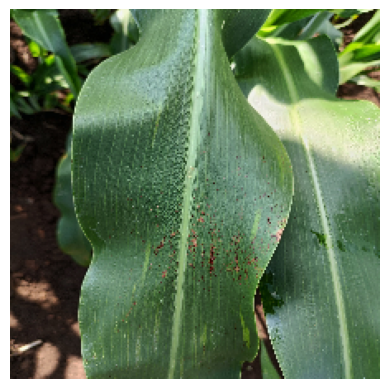

1/1 [==============================] - 0s 62ms/step
{'notRust': 0.19571159780025482, 'rust': 0.804288387298584}


C:\Users\Asus\AppData\Local\Temp\ipykernel_4392\1940373164.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  k=dict(zip(categories, map(float,pred)))


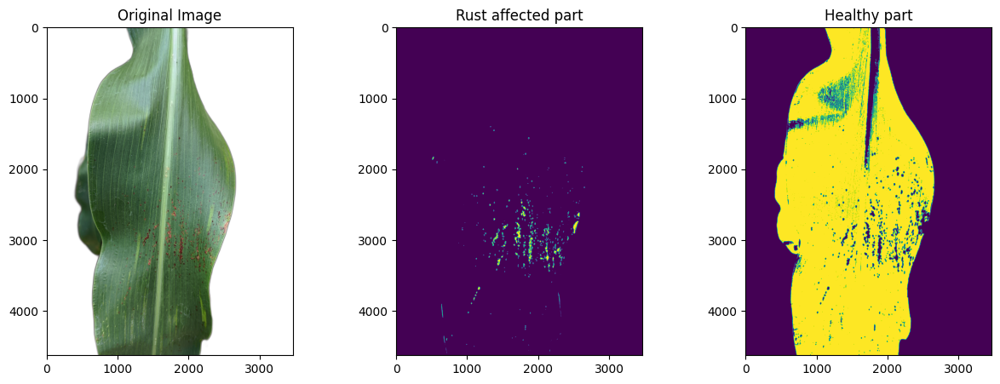

Rust Percentage: 1.39%


In [33]:
classify_images("D:/Documents/MML/mini Project/Dataset backup/rust/66.jpg")

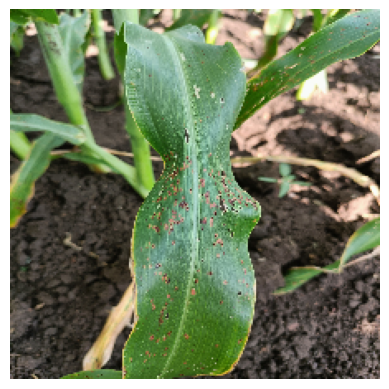

1/1 [==============================] - 0s 59ms/step
{'notRust': 0.08194837719202042, 'rust': 0.9180516600608826}


C:\Users\Asus\AppData\Local\Temp\ipykernel_4392\1940373164.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  k=dict(zip(categories, map(float,pred)))


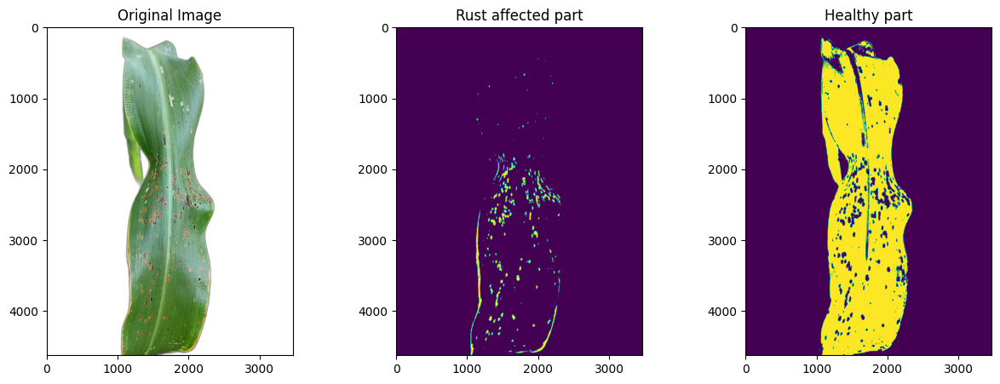

Rust Percentage: 5.78%


In [34]:
classify_images("D:/Documents/MML/mini Project/Dataset backup/rust/43.jpg")

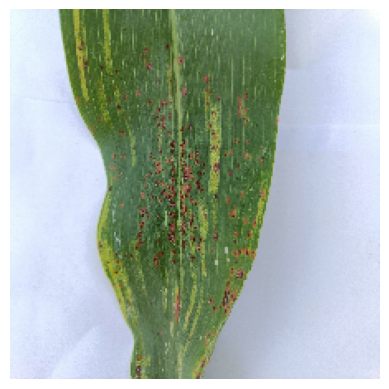

1/1 [==============================] - 0s 58ms/step
{'notRust': 0.003199828090146184, 'rust': 0.9968001842498779}


C:\Users\Asus\AppData\Local\Temp\ipykernel_4392\1940373164.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  k=dict(zip(categories, map(float,pred)))


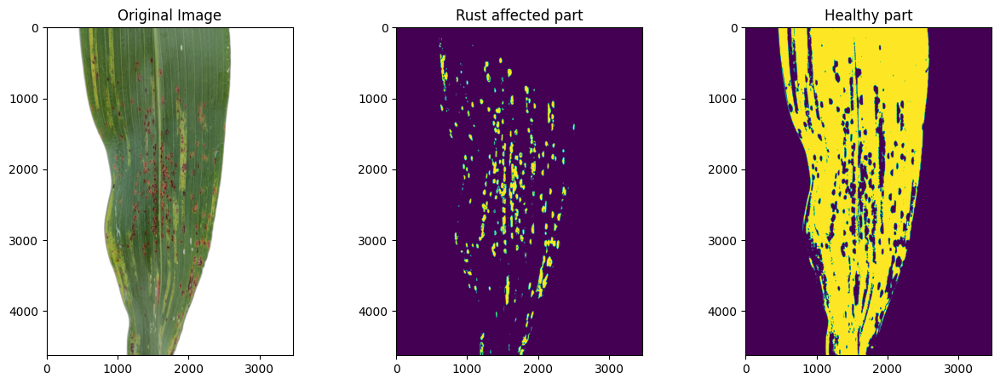

Rust Percentage: 9.30%


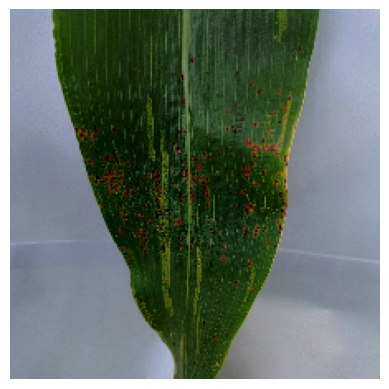

1/1 [==============================] - 0s 40ms/step
{'notRust': 0.016149401664733887, 'rust': 0.9838505387306213}


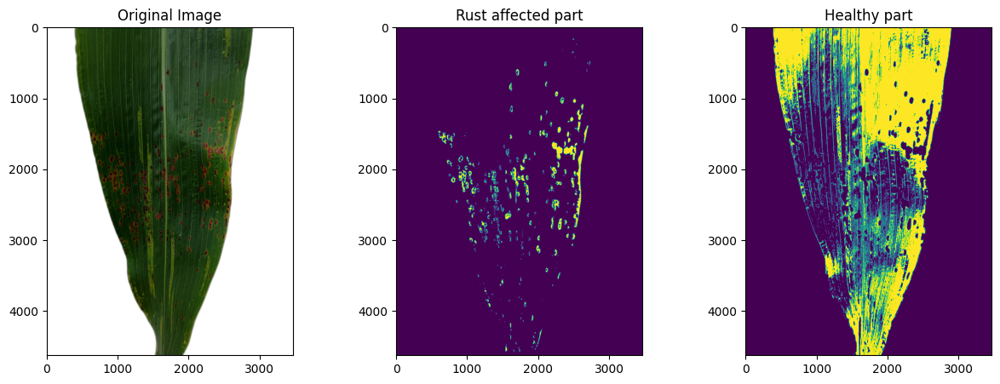

Rust Percentage: 7.38%


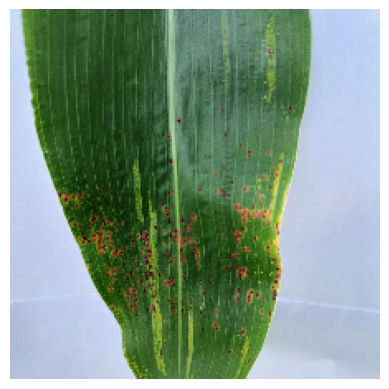

1/1 [==============================] - 0s 83ms/step
{'notRust': 0.008818124420940876, 'rust': 0.9911818504333496}


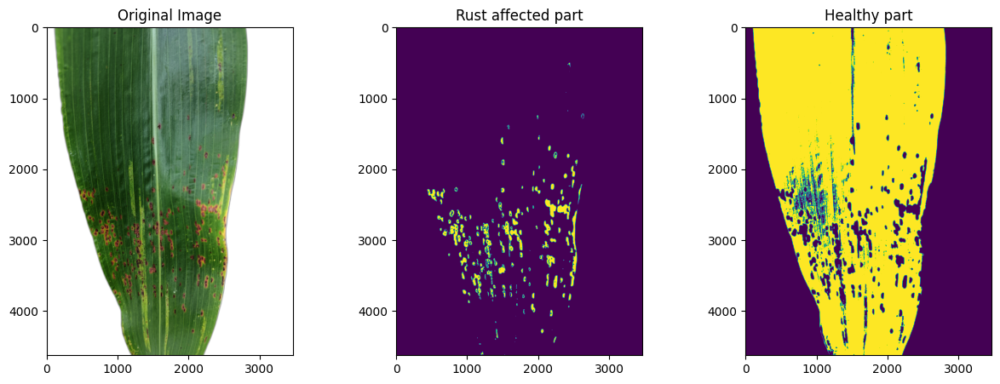

Rust Percentage: 5.11%


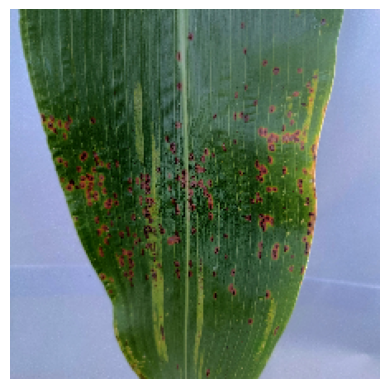

1/1 [==============================] - 0s 38ms/step
{'notRust': 0.007205806206911802, 'rust': 0.9927942156791687}


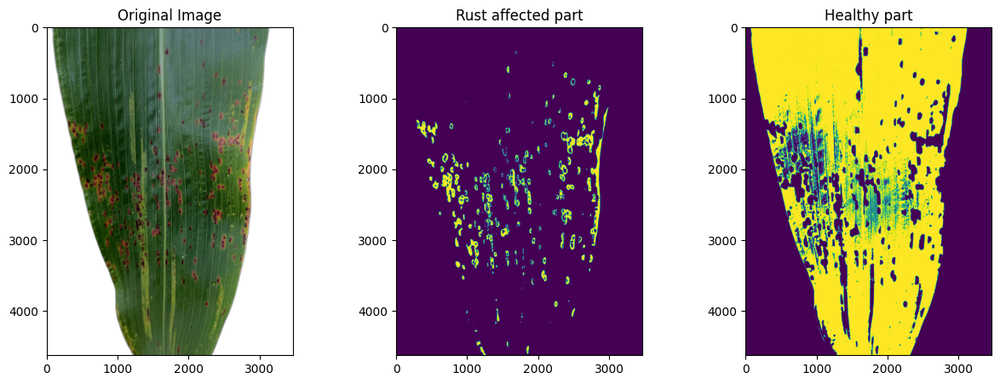

Rust Percentage: 7.39%


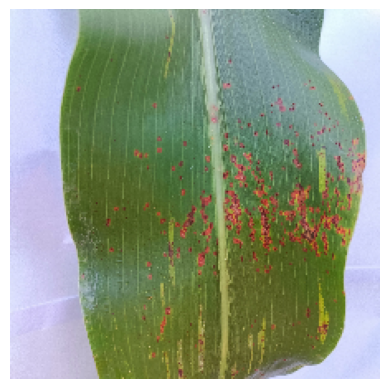

1/1 [==============================] - 0s 71ms/step
{'notRust': 0.029773300513625145, 'rust': 0.9702267050743103}


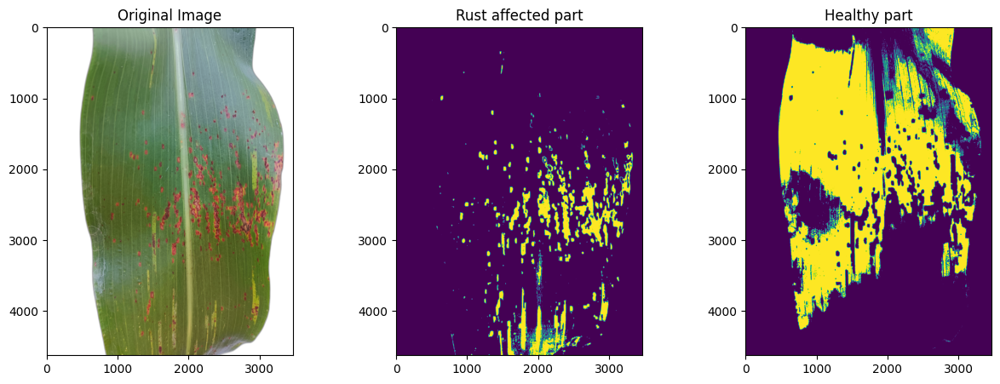

Rust Percentage: 16.74%


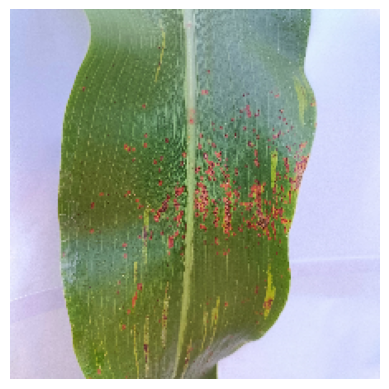

1/1 [==============================] - 0s 53ms/step
{'notRust': 0.009380587376654148, 'rust': 0.990619421005249}


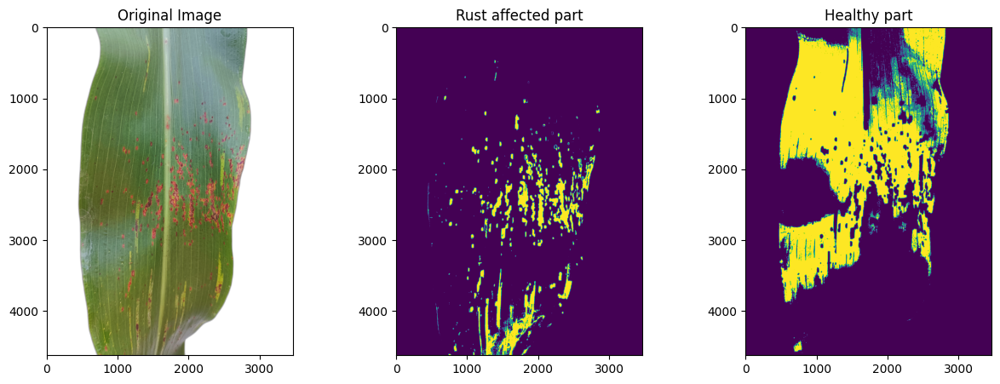

Rust Percentage: 16.61%


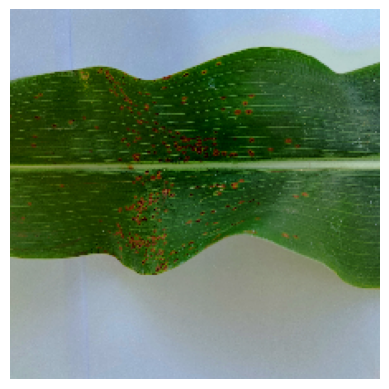

1/1 [==============================] - 0s 59ms/step
{'notRust': 0.0024828696623444557, 'rust': 0.9975171089172363}


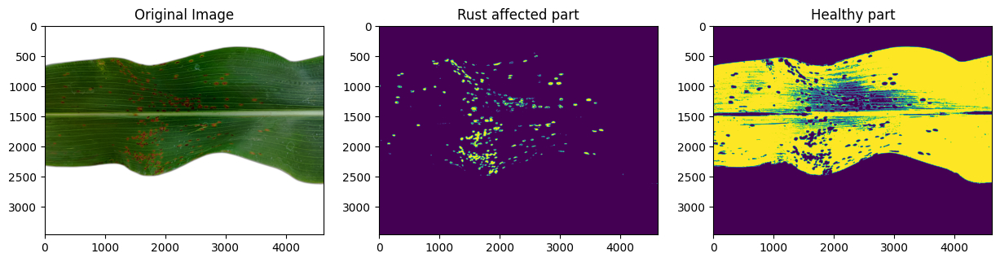

Rust Percentage: 3.88%


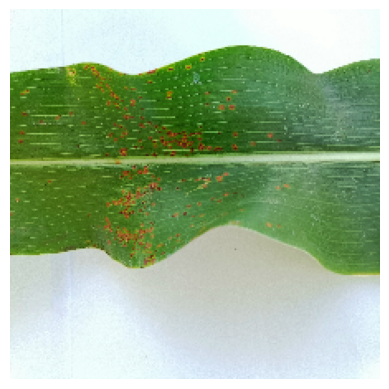

1/1 [==============================] - 0s 67ms/step
{'notRust': 0.004082406405359507, 'rust': 0.9959176182746887}


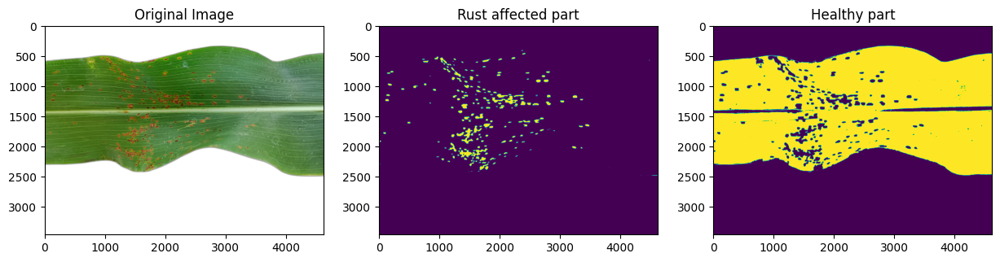

Rust Percentage: 4.27%


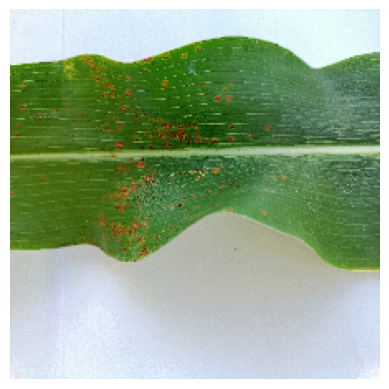

1/1 [==============================] - 0s 56ms/step
{'notRust': 0.005235259886831045, 'rust': 0.9947646856307983}


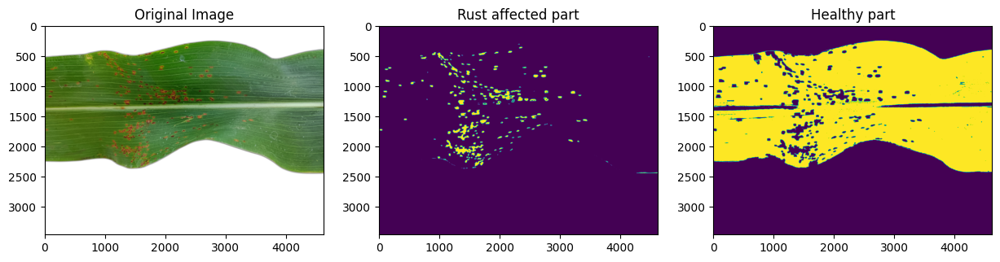

Rust Percentage: 4.33%


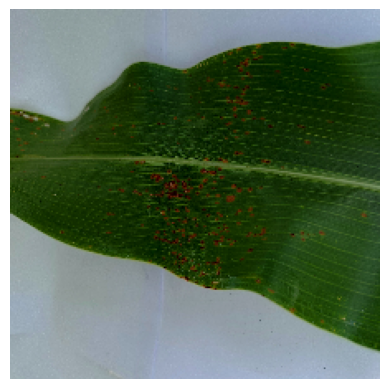

1/1 [==============================] - 0s 61ms/step
{'notRust': 0.011172493919730186, 'rust': 0.9888274669647217}


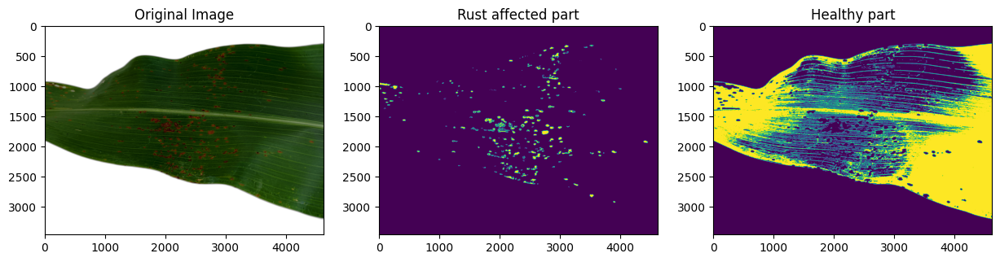

Rust Percentage: 4.30%


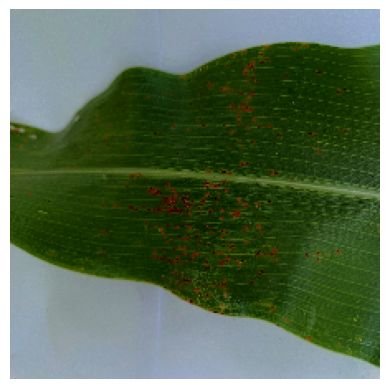

1/1 [==============================] - 0s 90ms/step
{'notRust': 0.016316577792167664, 'rust': 0.9836834073066711}


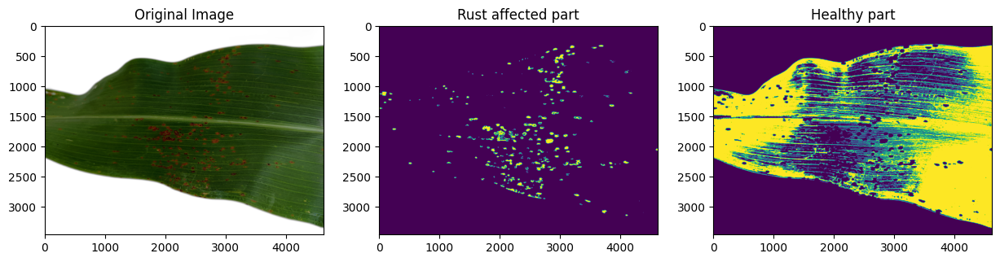

Rust Percentage: 5.18%


In [35]:
multi_classify(dpath+"rust/",10,20)

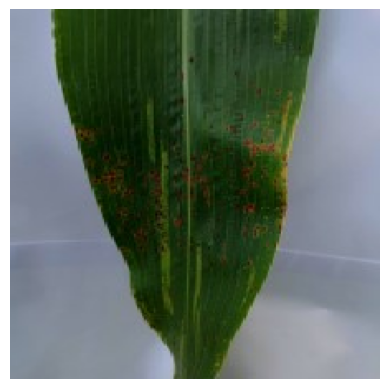

1/1 [==============================] - 0s 74ms/step
{'notRust': 0.07740263640880585, 'rust': 0.9225974082946777}


C:\Users\Asus\AppData\Local\Temp\ipykernel_14412\1940373164.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  k=dict(zip(categories, map(float,pred)))


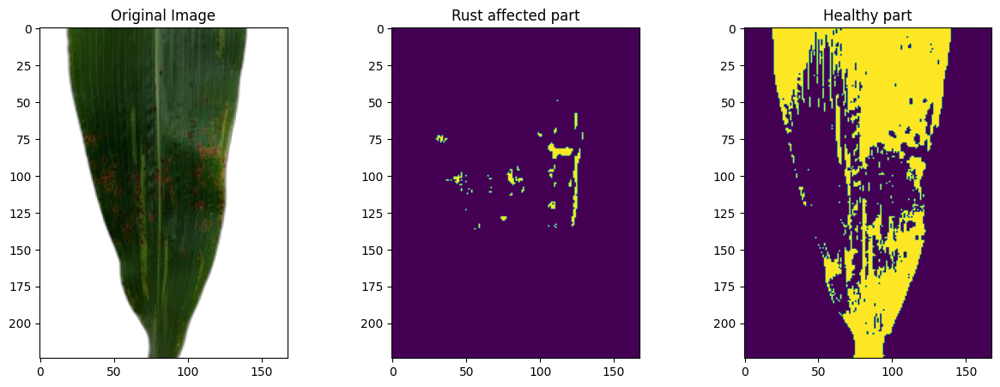

Rust Percentage: 3.82%


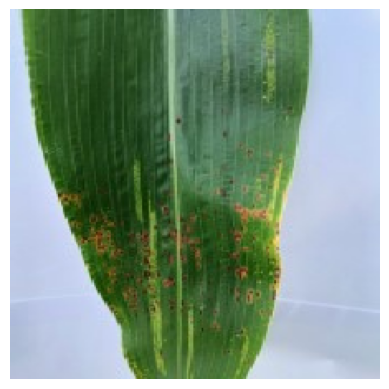

1/1 [==============================] - 0s 68ms/step
{'notRust': 0.31856703758239746, 'rust': 0.6814329624176025}


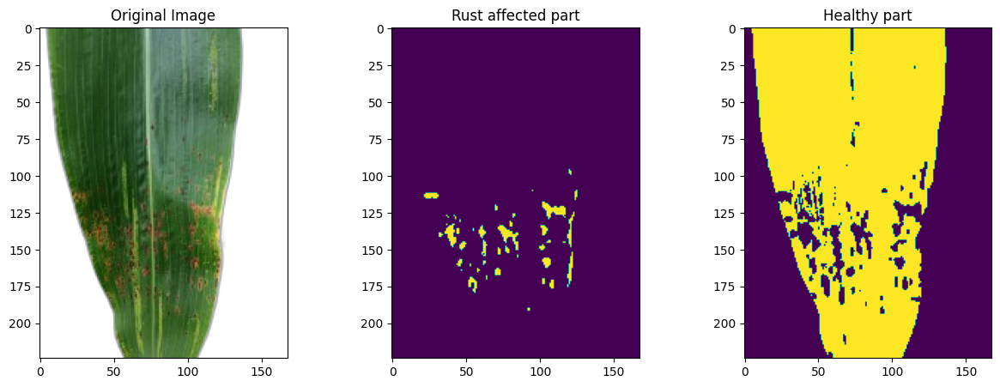

Rust Percentage: 3.31%


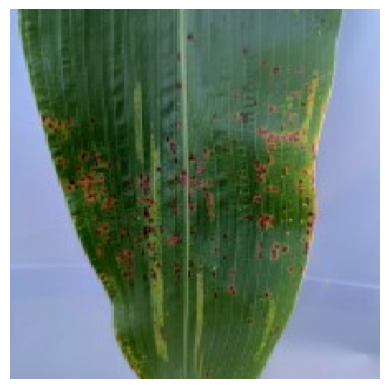

1/1 [==============================] - 0s 64ms/step
{'notRust': 0.05294495075941086, 'rust': 0.9470550417900085}


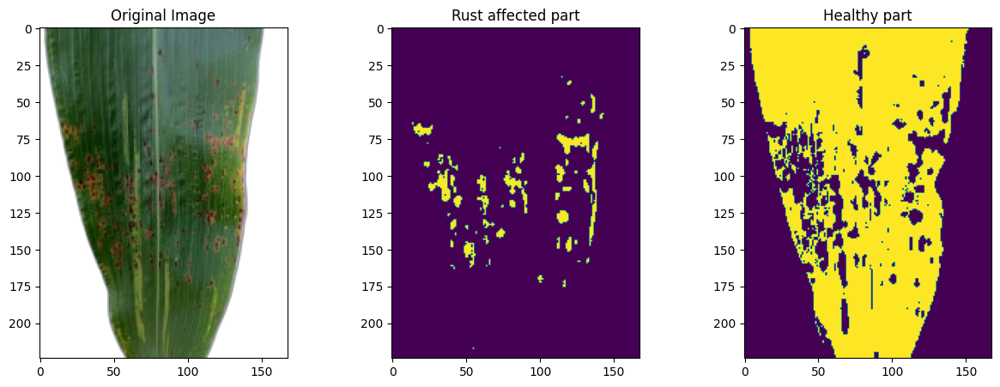

Rust Percentage: 6.54%


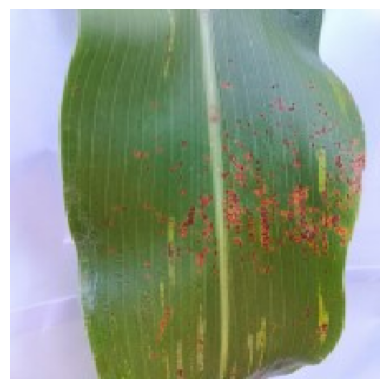

1/1 [==============================] - 0s 100ms/step
{'notRust': 0.07587381452322006, 'rust': 0.9241262078285217}


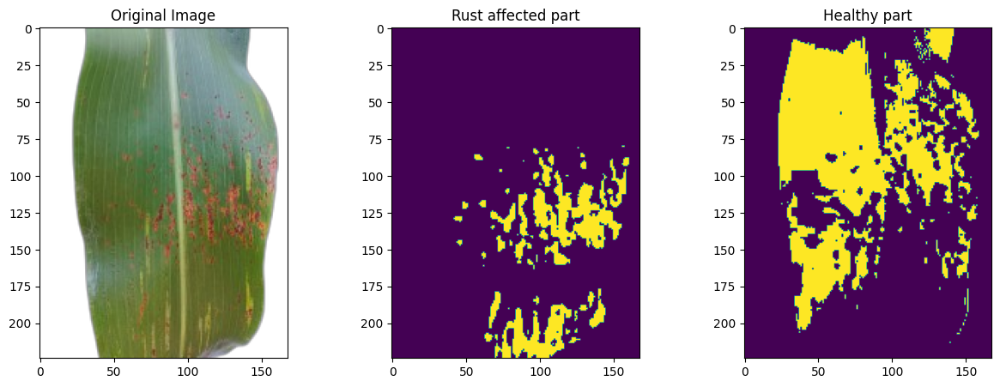

Rust Percentage: 23.99%


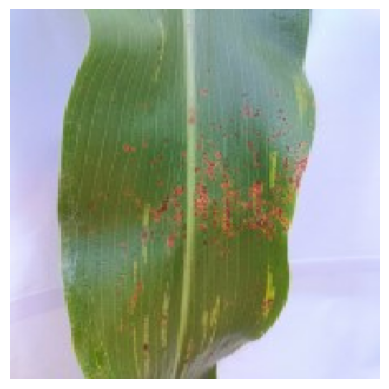

1/1 [==============================] - 0s 67ms/step
{'notRust': 0.06571267545223236, 'rust': 0.9342873096466064}


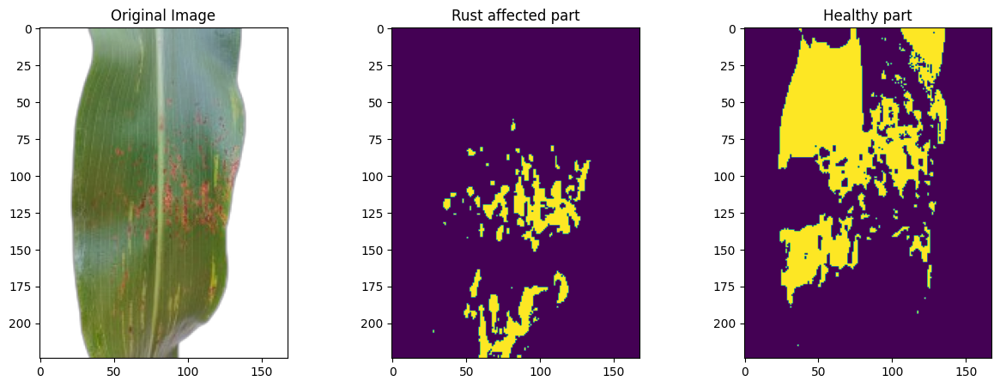

Rust Percentage: 23.26%


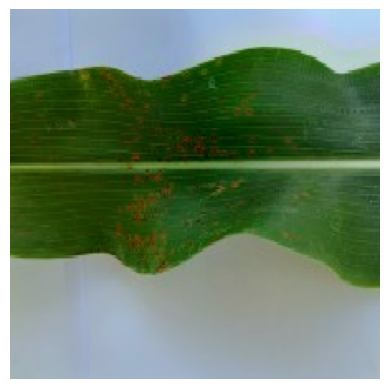

1/1 [==============================] - 0s 93ms/step
{'notRust': 0.02796684019267559, 'rust': 0.9720331430435181}


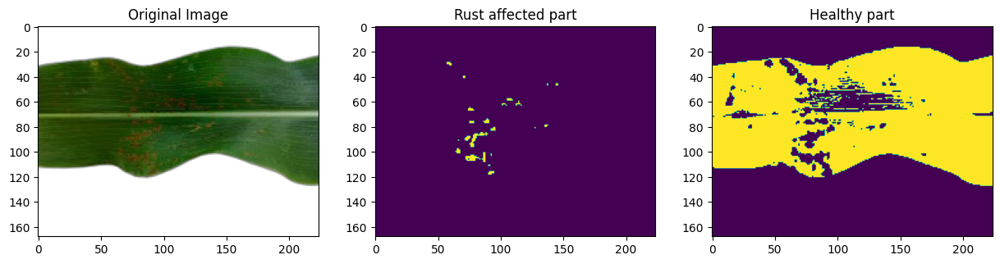

Rust Percentage: 1.31%


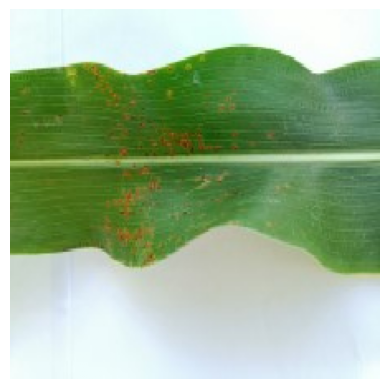

1/1 [==============================] - 0s 71ms/step
{'notRust': 0.03998669609427452, 'rust': 0.9600133299827576}


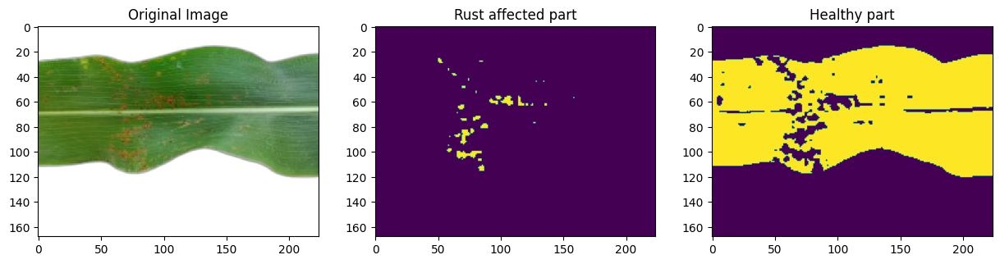

Rust Percentage: 2.16%


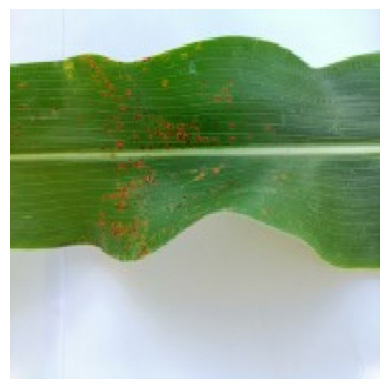

1/1 [==============================] - 0s 146ms/step
{'notRust': 0.06003722921013832, 'rust': 0.9399628043174744}


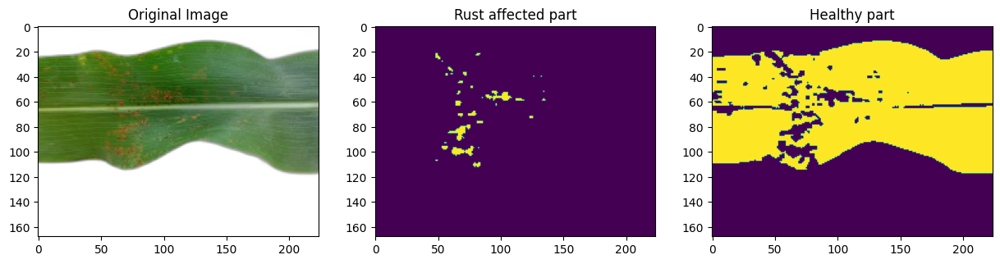

Rust Percentage: 2.36%


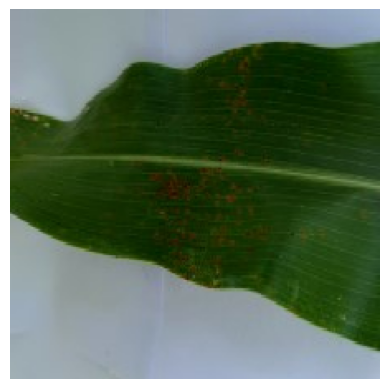

1/1 [==============================] - 0s 100ms/step
{'notRust': 0.1832740604877472, 'rust': 0.8167259097099304}


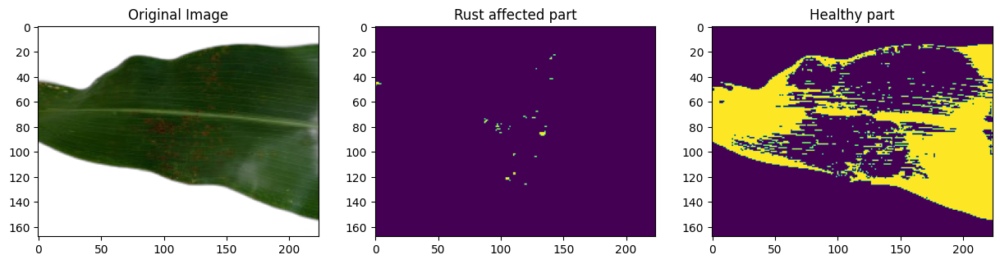

Rust Percentage: 0.68%


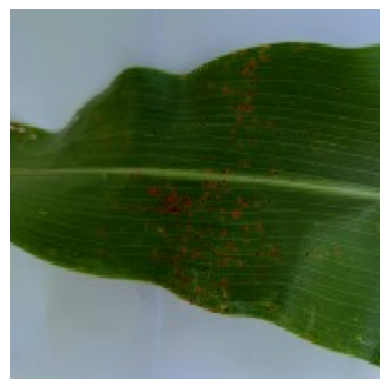

1/1 [==============================] - 0s 82ms/step
{'notRust': 0.04967273026704788, 'rust': 0.9503272771835327}


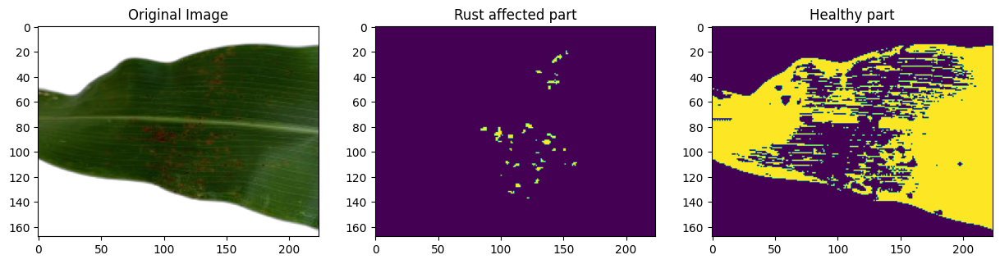

Rust Percentage: 1.72%


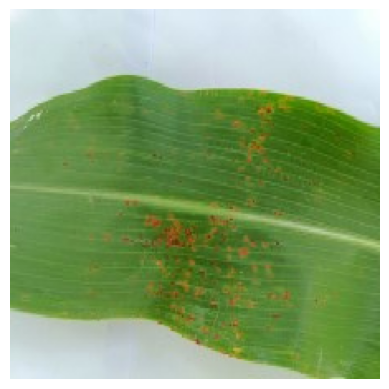

1/1 [==============================] - 0s 67ms/step
{'notRust': 0.11733201146125793, 'rust': 0.8826679587364197}


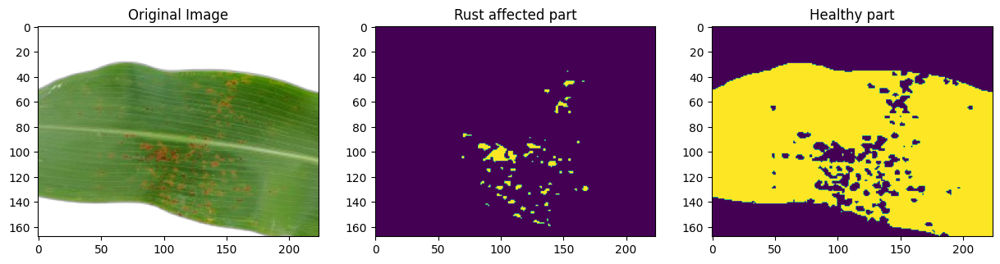

Rust Percentage: 2.76%


In [34]:
multi_classify("./Data/rust/",10,20)